## NLP

In [0]:
# read comments data in wallstreetbets subreddit
comments = spark.read.parquet("dbfs:/FileStore/comments_wallstreetbets.parquet") 

In [0]:
# set saving address
import os
PLOT_DIR = os.path.join("..","data", "plots")
CSV_DIR = os.path.join("..","data", "csv")
os.makedirs(PLOT_DIR, exist_ok=True)
os.makedirs(CSV_DIR, exist_ok=True)

In [0]:
# check the shape of the data
comments_row_count = comments.count()
comment_col_count = len(comments.columns)
print(f"shape of the comments dataframe is {comments_row_count:,}x{comment_col_count}")

shape of the comments dataframe is 40,309,654x21


#### Filter data

In [0]:
#filter the removed and deleted body
import pyspark.sql.functions as F
comments = comments.where((F.col("body") != '[removed]')&(F.col("body") != '[deleted]'))
# filter delete the row with '![img]' and "I am a bot from /r/wallstreetbets. Your submission was removed because was too short.""
comments = comments.withColumn('body', F.regexp_replace('body',r'(\!\[img\]\(emote\|t5_2th52\|\d+\))',''))\
                         .where(F.col("body") != '')
del_string="""I am a bot from /r/wallstreetbets. Your submission was removed because was too short. Please make it a comment if it's not worth expounding on."""
comments = comments.where(F.col("body") != del_string)

In [0]:
# check the shape of the data
comments_row_count = comments.count()
comment_col_count = len(comments.columns)
print(f"shape of the comments dataframe is {comments_row_count:,}x{comment_col_count}")

shape of the comments dataframe is 31,132,697x21


##### Merge exteral data

In [0]:
# import external data
# import stock market index data
# external dataset contains each day index of S&P 500, Nasdap and Dow Jones from 2021-01-01 to 2022-08-31
# the missing value of stock market closed day is filled by valid data the day before
import pandas as pd
stock_index = pd.read_csv('/Workspace/Repos/Project/fall-2022-reddit-big-data-project-project-group-21/data/stock_index.csv')
# clean
stock_index = stock_index.drop('Unnamed: 0',axis=1)
stock_index.rename(columns={"date":"d"},inplace =True)
stock_index

,d,sp500,nasdaq,dj
0,2021-01-01,3756.070068,12888.280273,30606.480469
1,2021-01-02,3756.070068,12888.280273,30606.480469
2,2021-01-03,3756.070068,12888.280273,30606.480469
3,2021-01-04,3700.649902,12698.450195,30223.890625
4,2021-01-05,3726.860107,12818.959961,30391.599609
...,...,...,...,...
603,2022-08-27,4057.659912,12141.709961,32283.400391
604,2022-08-28,4057.659912,12141.709961,32283.400391
605,2022-08-29,4030.610107,12017.669922,32098.990234
606,2022-08-30,3986.159912,11883.139648,31790.869141


In [0]:
# convert pandas dataframe to pyspark dataframe
stock = spark.createDataFrame(stock_index) 

In [0]:
# merge external data with comment data on date

from pyspark.sql.functions import *
# convert date column in stock to date format
stock = stock.withColumn('d', to_date(to_timestamp('d', 'yyyy-MM-dd').cast('timestamp'),"yyyy-MM-dd HH:mm:ss"))
# merge on dat
comment_new = comments.join(stock, comments.date == stock.d, 'left').drop('d').cache()

In [0]:
# check the shape of the data
comments_row_count = comment_new.count()
comment_col_count = len(comment_new.columns)
print(f"shape of the comments dataframe is {comments_row_count:,}x{comment_col_count}")

shape of the comments dataframe is 31,132,697x24


In [0]:
# group data by date
import pandas as pd
from pyspark.sql.functions import *
comment_by_date = comment_new.groupBy("date").agg(count("body").alias("comment_count"), \
                                                  avg("sp500").alias("sp500"), \
                                                  avg("nasdaq").alias("nasdaq"), 
                                                  avg("dj").alias("dj")).orderBy(col("date"), ascending=True).collect()
comment_by_date = spark.createDataFrame(comment_by_date).toPandas()

In [0]:
### for this plot, you can drag and select a region to zoom in 

In [0]:
import plotly.graph_objects as go
import plotly
import plotly.express as px
import matplotlib.pyplot as plt
from plotly.subplots import make_subplots

count = comment_by_date['comment_count']
date = comment_by_date['date']

fig = make_subplots(rows=3, cols=2,
                    subplot_titles=("<b>from 2021-01 to 2022-08</b>", "<b>from 2021-04 to 2022-08</b>", "", "", "", ""),
                    shared_xaxes=True,
                    vertical_spacing=0.02,
                    horizontal_spacing=0.16,
                    specs=[[{"secondary_y": True},{"secondary_y": True}], \
                           [{"secondary_y": True},{"secondary_y": True}],[{"secondary_y": True},{"secondary_y": True}]])

# sp500
fig.add_trace(
    go.Scatter(x=date, y=count, name="daily comment number",line=dict(color="#f38818")),
    row=1, col=1, secondary_y=False)

fig.add_trace(
    go.Scatter(x=date, y=comment_by_date['sp500'], name="sp500 index",line=dict(color="#7d90ff")),
    row=1, col=1, secondary_y=True
)

# Tnasdaq
fig.add_trace(
    go.Scatter(x=date, y=count,name="daily comment number", line=dict(color="#f38818"),showlegend=False),
    row=2, col=1, secondary_y=False,
)

fig.add_trace(
    go.Scatter(x=date, y=comment_by_date['nasdaq'], name="Nasdaq index",line=dict(color="#f599ab")),
    row=2, col=1, secondary_y=True,
)

# dj
fig.add_trace(
    go.Scatter(x=date, y=count, name="daily comment number",line=dict(color="#f38818"),showlegend=False),
    row=3, col=1, secondary_y=False,
)

fig.add_trace(
    go.Scatter(x=date, y=comment_by_date['dj'], name="Dow Jones index",line=dict(color="#e6d59c")),
    row=3, col=1, secondary_y=True,
)

# -------------------------------------------------------------------------------------------------
# sp500
fig.add_trace(
    go.Scatter(x=date[100:], y=count[100:], name="daily comment number",line=dict(color="#f38818"),showlegend=False),
    row=1, col=2, secondary_y=False)

fig.add_trace(
    go.Scatter(x=date[100:], y=comment_by_date['sp500'][100:], name="sp500 index",line=dict(color="#7d90ff"),showlegend=False),
    row=1, col=2, secondary_y=True,
)

# Tnasdaq
fig.add_trace(
    go.Scatter(x=date[100:], y=count[100:],name="daily comment number", line=dict(color="#f38818"),showlegend=False),
    row=2, col=2, secondary_y=False,
)

fig.add_trace(
    go.Scatter(x=date[100:], y=comment_by_date['nasdaq'][100:], name="Nasdaq index",line=dict(color="#f599ab"),showlegend=False),
    row=2, col=2, secondary_y=True,
)

# dj
fig.add_trace(
    go.Scatter(x=date[100:], y=count[100:], name="daily comment number",line=dict(color="#f38818"),showlegend=False),
    row=3, col=2, secondary_y=False,
)

fig.add_trace(
    go.Scatter(x=date[100:], y=comment_by_date['dj'][100:], name="Dow Jones index",line=dict(color="#e6d59c"),showlegend=False),
    row=3, col=2, secondary_y=True,
)



fig.update_layout(legend=dict(
    orientation="h",
    yanchor="bottom",
    y=1.1,
    xanchor="right",
    x=1),title="<b>Wallstreetbets Daily Comment Count VS Stock Market Index</b>",
        title_x = 0.5,
        title_y = 0.95,
        height=600,
        margin={"t": 150, "b": 0, "l": 0, "r": 0},
        hovermode=False,
        font=dict(
        family="Droid Sans",
        size=15,
        color='#696969'))
fig.update_xaxes(title_text='<b>Date</b>', title_font=dict(size=12),row=3)
fig.update_yaxes(title_text='<b>Daily Comment Count</b>', title_font=dict(size=12), row=2,col=1)
fig.update_yaxes(title_text='<b>Stock Market Index</b>', title_font=dict(size=12), row=2,col=2)



## Save the plot in the plot dir so that it can be checked in into the repo
fig.show()
fpath = os.path.join(PLOT_DIR, "comment_stockindex.html")
fig.write_html(fpath)

In [0]:
# save to DBFS
comment_new.write.mode('Overwrite').parquet('dbfs:/FileStore/comments_merged.parquet')

## Regex

### Character matches

In [0]:
comment_new = spark.read.parquet("dbfs:/FileStore/comments_merged.parquet") 

In [0]:
comments_new_column = comment_new.withColumn("dollar_sign", comment_new["body"].rlike("\$"))
comments_new_column = comments_new_column.withColumn("ellipsis", comments_new_column["body"].rlike("(\.{3})"))

### Keyword matches

In [0]:
labor_words = ["wage", "salary", "employ", "unemploy", "job", "labor", "labour"]
regex_labor = "(?i)\\b"+"|\\b".join(labor_words)
comments_new_column = comments_new_column.withColumn("labor", comments_new_column["body"].rlike(regex_labor))

In [0]:
yolo_words = ["yolo", "all in", "life saving", "leverage"]
regex_yolo = "(?i)\\b"+"|\\b".join(yolo_words)
comments_new_column = comments_new_column.withColumn("yolo", comments_new_column["body"].rlike(regex_yolo))

In [0]:
btd_words = ["btd", "btfd"]
regex_btd = "(?i)\\b"+"|\\b".join(btd_words)
comments_new_column = comments_new_column.withColumn("btd", comments_new_column["body"].rlike(regex_btd))

In [0]:
from pyspark.sql.functions import *
comments_new_column_year = comments_new_column.withColumn("year", year(from_unixtime(col('created_utc'))))
keyword_sum = comments_new_column_year.groupby("year").agg(avg(col("dollar_sign").cast("int")).alias("dollar"),
                                  avg(col("ellipsis").cast("int")).alias("ellipsis"),
                                  avg(col("labor").cast("int")).alias("labor"),
                                  avg(col("yolo").cast("int")).alias("yolo"),
                                  F.avg(col("btd").cast("int")).alias("btd")).toPandas()
keyword_sum.to_csv("../data/csv/keyword_sum.csv")
keyword_sum

,year,dollar,ellipsis,labor,yolo,btd
0,2022,0.045367,0.031290,0.011975,0.010696,0.000146
1,2021,0.066229,0.042643,0.007909,0.015963,0.000291


In [0]:
# filter data with dollar sign
df_dollar = comments_new_column.filter(col("dollar_sign"))
# group data by date
df_dollar_by_date = df_dollar.filter(col("dollar_sign")).groupBy("date").agg(count("body").alias("comment_count"), \
                                                  avg("sp500").alias("sp500"), \
                                                  avg("nasdaq").alias("nasdaq"), 
                                                  avg("dj").alias("dj")).orderBy(col("date"), ascending=True).collect()
df_dollar_by_date = spark.createDataFrame(df_dollar_by_date).toPandas()

In [0]:
### for this plot, you can drag and select a region to zoom in 

In [0]:
count = df_dollar_by_date['comment_count']
date = df_dollar_by_date['date']

fig = make_subplots(rows=3, cols=2,
                    subplot_titles=("<b>from 2021-01 to 2022-08</b>", "<b>from 2021-04 to 2022-08</b>", "", "", "", ""),
                    shared_xaxes=True,
                    vertical_spacing=0.02,
                    horizontal_spacing=0.16,
                    specs=[[{"secondary_y": True},{"secondary_y": True}], \
                           [{"secondary_y": True},{"secondary_y": True}],[{"secondary_y": True},{"secondary_y": True}]])

# sp500
fig.add_trace(
    go.Scatter(x=date, y=count, name="daily comment number",line=dict(color="#f38818")),
    row=1, col=1, secondary_y=False)

fig.add_trace(
    go.Scatter(x=date, y=df_dollar_by_date['sp500'], name="sp500 index",line=dict(color="#7d90ff")),
    row=1, col=1, secondary_y=True
)

# Tnasdaq
fig.add_trace(
    go.Scatter(x=date, y=count,name="daily comment number", line=dict(color="#f38818"),showlegend=False),
    row=2, col=1, secondary_y=False,
)

fig.add_trace(
    go.Scatter(x=date, y=df_dollar_by_date['nasdaq'], name="Nasdaq index",line=dict(color="#f599ab")),
    row=2, col=1, secondary_y=True,
)

# dj
fig.add_trace(
    go.Scatter(x=date, y=count, name="daily comment number",line=dict(color="#f38818"),showlegend=False),
    row=3, col=1, secondary_y=False,
)

fig.add_trace(
    go.Scatter(x=date, y=df_dollar_by_date['dj'], name="Dow Jones index",line=dict(color="#e6d59c")),
    row=3, col=1, secondary_y=True,
)

# -------------------------------------------------------------------------------------------------
# sp500
fig.add_trace(
    go.Scatter(x=date[100:], y=count[100:], name="daily comment number",line=dict(color="#f38818"),showlegend=False),
    row=1, col=2, secondary_y=False)

fig.add_trace(
    go.Scatter(x=date[100:], y=df_dollar_by_date['sp500'][100:], name="sp500 index",line=dict(color="#7d90ff"),showlegend=False),
    row=1, col=2, secondary_y=True,
)

# Tnasdaq
fig.add_trace(
    go.Scatter(x=date[100:], y=count[100:],name="daily comment number", line=dict(color="#f38818"),showlegend=False),
    row=2, col=2, secondary_y=False,
)

fig.add_trace(
    go.Scatter(x=date[100:], y=df_dollar_by_date['nasdaq'][100:], name="Nasdaq index",line=dict(color="#f599ab"),showlegend=False),
    row=2, col=2, secondary_y=True,
)

# dj
fig.add_trace(
    go.Scatter(x=date[100:], y=count[100:], name="daily comment number",line=dict(color="#f38818"),showlegend=False),
    row=3, col=2, secondary_y=False,
)

fig.add_trace(
    go.Scatter(x=date[100:], y=df_dollar_by_date['dj'][100:], name="Dow Jones index",line=dict(color="#e6d59c"),showlegend=False),
    row=3, col=2, secondary_y=True,
)



fig.update_layout(legend=dict(
    orientation="h",
    yanchor="bottom",
    y=1.1,
    xanchor="right",
    x=1),title="<b>Wallstreetbets Daily Comment Count (with Dollar Sign) VS Stock Market Index</b>",
        title_x = 0.5,
        title_y = 0.95,
        height=600,
        margin={"t": 150, "b": 0, "l": 0, "r": 0},
        hovermode=False,
        font=dict(
        family="Droid Sans",
        size=15,
        color='#696969'))
fig.update_xaxes(title_text='<b>Date</b>', title_font=dict(size=12),row=3)
fig.update_yaxes(title_text='<b>Daily Comment Count</b>', title_font=dict(size=12), row=2,col=1)
fig.update_yaxes(title_text='<b>Stock Market Index</b>', title_font=dict(size=12), row=2,col=2)



## Save the plot in the plot dir so that it can be checked in into the repo
fig.show()
fpath = os.path.join(PLOT_DIR, "comment_stockindex(dollar).html")
fig.write_html(fpath)

## Reduce data size by filters

In [0]:
from pyspark.sql.functions import *
comments_new_column_year = comments_new_column.withColumn("year", year(from_unixtime(col('created_utc'))))
data_distribution = comments_new_column_year.groupby("year").agg(avg(col("dollar_sign").cast("int")).alias("dollar"),
                                  avg(col("ellipsis").cast("int")).alias("ellipsis"),
                                  avg(col("labor").cast("int")).alias("labor"),
                                  avg(col("yolo").cast("int")).alias("yolo"),
                                  F.avg(col("btd").cast("int")).alias("btd")).toPandas()
data_distribution

,year,dollar,ellipsis,labor,yolo,btd
0,2022,0.045367,0.031290,0.011975,0.010696,0.000146
1,2021,0.066229,0.042643,0.007909,0.015963,0.000291


This summary table displays the ratio of several stock-related topics among the WallStreetBets Subreddit comments in 2021 and 2022.<br>
First of all, the ratios of those topics are not as big as a crucial part of the game, possibly indicating that comments tend to be more related to personal communication rather than direct references on stock market actions where people usually use those topics to describe their actions.<br>
Secondly, we could see that ratios of comments including dollar sign($), ellipsis(...), yolo(you can only live once) and btd(buy the dip) all dropped in 2022, from ~30% to ~50%. If we regard dollar sign as stock-related, ellipsis as people's awkward/sad attitude, yolo and btd as indicator of stock market behavior, then the dropping usage of those keywords might lead to a hypothesis that Reddit users in this Subreddit are having a lower interest on investing in the stock market, while a raise in labor-related topic's popularity might indicate that people are concerning more on the labor market rather than stock market. This hypothesis is tempting since it matches the fact that world economy gets further worsened by the long-lived pandemic of COVID-19 in 2022, when people possibly find themselves more needy for a steady job rather than investing their budget into the volatile stock market.

In [0]:
comments_new_column.createOrReplaceTempView('comment_vw')
results1 = spark.sql('select avg(score) as mean_score, percentile(score, 0.01) as Q1, percentile(score, 0.25) as Q25, \
                     percentile(score, 0.5) as median, percentile(score, 0.75) as Q75, percentile(score, 0.99) as Q99 \
                     from comment_vw')
results1.show()

+-----------------+----+---+------+---+----+
|       mean_score|  Q1|Q25|median|Q75| Q99|
+-----------------+----+---+------+---+----+
|8.483957139980516|-5.0|1.0|   2.0|5.0|83.0|
+-----------------+----+---+------+---+----+



In [0]:
# high score comment 95%-99% with dollar sign
high_score_boundary = spark.sql('select percentile(score, 0.95) as Q95, percentile(score, 0.99) as Q99 \
                     from comment_vw').toPandas()
high_score_boundary

,Q95,Q99
0,20.0,83.0


In [0]:
comment_highscore = comments_new_column.filter(col("dollar_sign")).filter((col('score') >= 20) & (col('score') <= 83))
comment_highscore.count()

Out[32]: 133259

#### Text clean

In [0]:
from sparknlp.base import Finisher
import sparknlp
from sparknlp.pretrained import PretrainedPipeline
from sparknlp.base import *
from sparknlp.annotator import *
from pyspark.ml import Pipeline
import pyspark.sql.functions as F
from pyspark.sql.functions import avg, col

documentAssembler = DocumentAssembler() \
.setInputCol("body") \
.setOutputCol("document")

sentenceDetector = SentenceDetector() \
.setInputCols(["document"]) \
.setOutputCol("sentence")

tokenizer = Tokenizer() \
.setInputCols(["sentence"]) \
.setOutputCol("token")

stop_words = StopWordsCleaner() \
.setInputCols(["token"]) \
.setOutputCol("cleanTokens")

pipeline = PretrainedPipeline("check_spelling", "en")

lemmatizer = LemmatizerModel.pretrained() \
.setInputCols(["cleanTokens"]) \
.setOutputCol("lemma")

normalizer = Normalizer() \
.setInputCols(["lemma"]) \
.setOutputCol("normal") \
.setLowercase(True) \
.setCleanupPatterns([("""[^A-Za-z]""")])

tokenAssembler = TokenAssembler() \
.setInputCols("document", "normal") \
.setOutputCol("cleanText")

embedding = WordEmbeddingsModel.pretrained() \
.setInputCols(["document","normal"]) \
.setOutputCol("embeddings")

embeddingsFinisher = EmbeddingsFinisher() \
.setInputCols("embeddings") \
.setOutputCols("finished_sentence_embeddings") \
.setOutputAsVector(True) \
.setCleanAnnotations(False)  \

finisher = Finisher() \
     .setInputCols(['normal',"cleanText"])

pipeline = Pipeline() \
.setStages([
documentAssembler,
sentenceDetector,
tokenizer,
stop_words,
lemmatizer,
normalizer,
tokenAssembler,
embedding,
embeddingsFinisher,
finisher
])

result_token = pipeline.fit(comment_highscore).transform(comment_highscore)
result_token.show()

check_spelling download started this may take some time.
Approx size to download 913.5 KB
[OK!]
lemma_antbnc download started this may take some time.
Approximate size to download 907.6 KB
[OK!]
glove_100d download started this may take some time.
Approximate size to download 145.3 MB
[OK!]
+------------------+--------------------+--------+----------------+-----------+------+------+-------+------------+---------+----------+--------------------+-----+--------+--------------+------------+----------+-----------+-----+----+---------------+---------------+--------------+------------+-----------+--------+-----+-----+-----+----------------------------+--------------------+--------------------+
|            author|                body|can_gild|controversiality|created_utc|edited|gilded|     id|is_submitter|  link_id| parent_id|           permalink|score|stickied|     subreddit|subreddit_id|      date|day_of_week|month|hour|account_deleted|          sp500|        nasdaq|          dj|dollar_sign

In [0]:
# save to DBFS
result_token.write.mode('Overwrite').parquet('dbfs:/FileStore/text_clean.parquet')

## Conduct basic data text checks/analysis

In [0]:
result_token.count()

Out[129]: 133259

In [0]:
result_token = spark.read.parquet("dbfs:/FileStore/text_clean.parquet") 
import pyspark.sql.functions as F

In [0]:
import pyspark.sql.functions as F
# calculate the lengh of body and create a new column to stored it
result_token1 = result_token.withColumn("length_of_body", F.size("finished_normal")) \
.withColumn("year", year(from_unixtime(col('created_utc'))))

In [0]:
#summary table for body lenghs
result_token1.createOrReplaceTempView('result_token_vw')
result_token_body_lenghs_summary = spark.sql('select year, MIN(length_of_body) as min,percentile(length_of_body, 0.01) as Q1, percentile(length_of_body, 0.25) as Q25, \
                     percentile(length_of_body, 0.5) as median,round(avg(length_of_body),2) as mean, percentile(length_of_body, 0.75) as Q75, percentile(score, 0.99) as Q99, Max(score) as max \
                     from result_token_vw \
                     group by year').toPandas()
result_token_body_lenghs_summary

,year,min,Q1,Q25,median,mean,Q75,Q99,max
0,2022,0,1.0,5.0,10.0,19.26,21.0,80.0,83
1,2021,0,1.0,5.0,9.0,18.62,18.0,80.0,83


In [0]:
#summary table for controversiality
result_token_controversiality_summary = spark.sql('select year, avg(controversiality) as percentage \
                     from result_token_vw \
                     group by year').toPandas()
result_token_controversiality_summary

,year,percentage
0,2022,0.003309
1,2021,0.001157


In [0]:
#summary table for score
result_token_score_summary = spark.sql('select year, MIN(score) as min,percentile(score, 0.01) as Q1, percentile(score, 0.25) as Q25, \
                     percentile(score, 0.5) as median,round(avg(score),2) as mean, percentile(score, 0.75) as Q75, percentile(score, 0.99) as Q99, Max(score) as max \
                     from result_token_vw \
                     group by year').toPandas()
result_token_score_summary

,year,min,Q1,Q25,median,mean,Q75,Q99,max
0,2022,20,20.0,24.0,31.0,37.01,46.0,80.0,83
1,2021,20,20.0,23.0,30.0,34.68,41.0,80.0,83


In [0]:
import pandas as pd
summary_df = pd.concat([result_token_body_lenghs_summary, result_token_score_summary,result_token_controversiality_summary],axis = 0)
summary_df['feature_name'] = ['comment words number','comment words number','comment score','comment score','controversiality','controversiality']
summary_df = summary_df[['feature_name','year', 'min', 'Q1', 'Q25', 'median', 'mean', 'Q75', 'Q99', 'max','percentage']]
summary_df

,feature_name,year,min,Q1,Q25,median,mean,Q75,Q99,max,percentage
0,comment words number,2022,0.0,1.0,5.0,10.0,19.26,21.0,80.0,83.0,NaN
1,comment words number,2021,0.0,1.0,5.0,9.0,18.62,18.0,80.0,83.0,NaN
0,comment score,2022,20.0,20.0,24.0,31.0,37.01,46.0,80.0,83.0,NaN
1,comment score,2021,20.0,20.0,23.0,30.0,34.68,41.0,80.0,83.0,NaN
0,controversiality,2022,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.003309
1,controversiality,2021,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.001157


In [0]:
# save summary table
fpath = os.path.join(CSV_DIR, "features_quantile.csv")
summary_df.to_csv(fpath)

In [0]:
summary_df.columns

Out[307]: Index(['year', 'min', 'Q1', 'Q25', 'median', 'mean', 'Q75', 'Q99', 'max',
       'percentage', 'feature_name'],
      dtype='object')

### Distribution of text lenghs

As we can find from this summary table, the most frequent text lenghs is 27. Let's take a look at some rows which body lengh are 27.

In [0]:
len_table = result_token1.groupBy("length_of_body")\
           .agg(F.count('length_of_body').alias('body_text_lengh_count'))\
           .sort("length_of_body").toPandas()
len_table

,length_of_body,body_text_lengh_count
0,0,686
1,1,3749
2,2,6489
3,3,8633
4,4,9580
...,...,...
476,1185,1
477,1189,1
478,1211,1
479,1264,1


In [0]:
result_token1.where(F.col('length_of_body')==0).select('body','finished_normal').show(30)

+--------------------+---------------+
|                body|finished_normal|
+--------------------+---------------+
|   $326 💦💦💦💦💦💦|             []|
|We did it! Over $320|             []|
|$328.68!!!! WE DI...|             []|
|    12 more at $169!|             []|
|             $10,000|             []|
|            #$400=🥜|             []|
|            #$400=🥜|             []|
|              $6000*|             []|
|            #$300=🥜|             []|
|             $6942.0|             []|
|𝗧𝗛𝗜𝗦 𝗜𝗦 𝗚?...|             []|
|   Above $320 😎😎😎|             []|
|                $100|             []|
|             $420.69|             []|
|       $1,000-$5,000|             []|
|                 $10|             []|
|150 @ $35. \n🚀🚀...|             []|
|            7 @ $353|             []|
|            #$320=🥜|             []|
|           $6969.69*|             []|
|         $4204.20 🚀|             []|
|      $1000 🚀🚀🚀🚀|             []|
|             $69,420|             []|
|    100 at 1

In [0]:
result_token1.groupBy("length_of_body")\
           .agg(F.count('length_of_body').alias('body_text_lengh_count'))\
           .sort(F.desc("body_text_lengh_count")).show()

+--------------+---------------------+
|length_of_body|body_text_lengh_count|
+--------------+---------------------+
|             4|                 9502|
|             5|                 9204|
|             6|                 8814|
|             3|                 8568|
|             7|                 8087|
|             8|                 7075|
|             2|                 6412|
|             9|                 6315|
|            10|                 5500|
|            11|                 4822|
|            12|                 4263|
|            13|                 3818|
|             1|                 3704|
|            14|                 3243|
|            15|                 2981|
|            16|                 2596|
|            17|                 2292|
|            18|                 2127|
|            19|                 1799|
|            20|                 1708|
+--------------+---------------------+
only showing top 20 rows



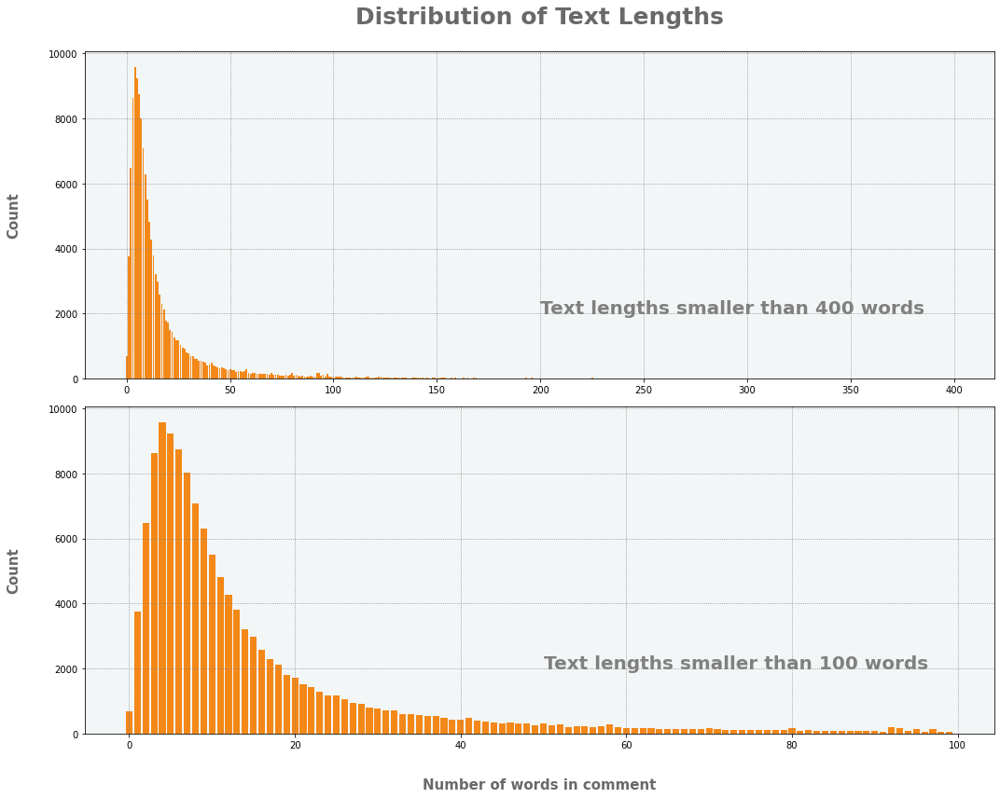

In [0]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
# plot text lengh distribution 
plt.figure()
plt.rcParams['figure.figsize'] = [15, 12]
plt.subplot(211)
plt.rcParams['axes.facecolor']='#f3f6f7'
plt.grid(True,linestyle=':',color='gray')
plt.bar(range(400),len_table['body_text_lengh_count'][:400],color = "#f38818")
#plt.xlabel("Number of words in comment", fontsize = 15,fontweight='bold',labelpad=30)
plt.ylabel("Count", fontsize = 15,fontweight='bold',labelpad=30,color ='#696969')
plt.text(200,2000,'Text lengths smaller than 400 words', fontsize = 20, fontweight ='bold',color='gray')
plt.title('Distribution of Text Lengths',fontsize = 25, fontweight='bold',pad=30,color='#696969')
 
plt.subplot(212)
plt.grid(True,linestyle=':',color='gray')
plt.bar(range(100),len_table['body_text_lengh_count'][:100],color = "#f38818")
plt.xlabel("Number of words in comment", fontsize = 15,fontweight='bold',labelpad=30,color ='#696969')
plt.ylabel("Count", fontsize = 15,fontweight='bold',labelpad=30,color ='#696969')
plt.text(50,2000,'Text lengths smaller than 100 words', fontsize = 20, fontweight ='bold',color='gray')
plt.tight_layout()
 
## Save the plot in the plot dir so that it can be checked in into the repo
plot_fpath = os.path.join(PLOT_DIR, 'distribution_text_length.png')
plt.savefig(plot_fpath)
plt.show()

### Top words in comment

In [0]:
#pipeline for tfidf
from pyspark.ml.feature import CountVectorizer
from pyspark.ml.feature import IDF
vectorizer = CountVectorizer(inputCol='finished_normal', outputCol='tf_features')
idf = IDF(inputCol='tf_features', outputCol='tf_idf_features')
pipeline = Pipeline(stages=[vectorizer, idf])
model = pipeline.fit(result_token1)

In [0]:
#bl
result_token1_2021 = result_token1.filter(year(from_unixtime(col('created_utc'))) == 2021)
result_token1_2022 = result_token1.filter(year(from_unixtime(col('created_utc'))) == 2022)
result_token1_2022.show()


In [0]:
import numpy as np

total_counts = model.transform(result_token1_2021)\
                    .select('tf_features').rdd\
                    .map(lambda row: row['tf_features'].toArray())\
                    .reduce(lambda x,y: [x[i]+y[i] for i in range(len(y))])

vocabList = model.stages[0].vocabulary
d = {'vocabList':vocabList,'counts':total_counts}

freq_2021 = spark.createDataFrame(np.array(list(d.values())).T.tolist(),list(d.keys()))
freq_2021.show()

+---------+-------+
|vocabList| counts|
+---------+-------+
|      buy|37242.0|
|    share|32351.0|
|      gme|33231.0|
|       go|26863.0|
|     sell|27690.0|
|      get|24798.0|
|     hold|23023.0|
|    stock|19172.0|
|        k|16263.0|
|     like|16508.0|
|    price|16791.0|
|     make|14167.0|
|    short|13762.0|
|     call|11001.0|
|      day|11286.0|
|      see|11011.0|
|     back|10693.0|
|    money|10063.0|
|   people|10201.0|
|    think|10234.0|
+---------+-------+
only showing top 20 rows



In [0]:
fpath = os.path.join(CSV_DIR, "topword_2021.csv")
freq_2021.toPandas().to_csv(fpath)
fpath = os.path.join(CSV_DIR, "topword_2022.csv")
freq_2022.toPandas().to_csv(fpath)

In [0]:
total_counts = model.transform(result_token1_2021)\
                    .select('tf_features').rdd\
                    .map(lambda row: row['tf_features'].toArray())\
                    .reduce(lambda x,y: [x[i]+y[i] for i in range(len(y))])
# vocabruary
vocabList = model.stages[0].vocabulary
d = {'vocabList':vocabList,'counts':total_counts}

freq_2021 = spark.createDataFrame(np.array(list(d.values())).T.tolist(),list(d.keys()))
freq.show()

+---------+------+
|vocabList|counts|
+---------+------+
|      buy|3422.0|
|    share|2405.0|
|      gme|1333.0|
|       go|3219.0|
|     sell|2206.0|
|      get|2858.0|
|     hold| 805.0|
|    stock|1538.0|
|        k|3289.0|
|     like|2286.0|
|    price|1991.0|
|     make|2280.0|
|    short| 691.0|
|     call|1531.0|
|      day|1186.0|
|      see|1173.0|
|     back|1174.0|
|    money|1521.0|
|   people|1336.0|
|    think|1221.0|
+---------+------+
only showing top 20 rows



### TF-IDF

In [0]:
from pyspark.ml.feature import CountVectorizer
tfizer = CountVectorizer(inputCol='finished_normal',
                         outputCol='tf_features')
tf_model = tfizer.fit(result_token1_2021)
tf_result_2021 = tf_model.transform(result_token1_2021)
tf_model = tfizer.fit(result_token1_2022)
tf_result_2022 = tf_model.transform(result_token1_2022)

In [0]:
from pyspark.ml.feature import IDF
idfizer = IDF(inputCol='tf_features', 
              outputCol='tf_idf_features')
idf_model = idfizer.fit(tf_result_2021)
tfidf_result_2021 = idf_model.transform(tf_result_2021)
idf_model = idfizer.fit(tf_result_2022)
tfidf_result_2022 = idf_model.transform(tf_result_2022)

In [0]:
from pyspark.ml.functions import vector_to_array
tfidf_2021_c = tfidf_result_2021.select('tf_idf_features')
# create two new colnum
tfidf_2021_c = tfidf_2021_c.withColumn("array",vector_to_array("tf_idf_features"))\
.withColumn("max_index_col",F.expr("array_position(array,array_max(array))"))
# count frequency
key_word_index_2021 = tfidf_2021_c.groupBy('max_index_col').count().orderBy(col("count"), ascending=False)

tfidf_2022_c = tfidf_result_2022.select('tf_idf_features')
# create two new colnum
tfidf_2022_c = tfidf_2022_c.withColumn("array",vector_to_array("tf_idf_features"))\
.withColumn("max_index_col",F.expr("array_position(array,array_max(array))"))
# count frequency
key_word_index_2022 = tfidf_2022_c.groupBy('max_index_col').count().orderBy(col("count"), ascending=False)

In [0]:
from pyspark.sql.functions import udf
def vocab(i):
    return vocabList[i]
udf_word = udf(lambda x:vocab(x))
key_word_index_2021 = key_word_index_2021.withColumn("word",udf_word(col("max_index_col")))
key_word_index_2022 = key_word_index_2022.withColumn("word",udf_word(col("max_index_col")))

In [0]:
#save summary table
fpath = os.path.join(CSV_DIR, "tfidf_2021.csv")
key_word_index_2021.toPandas().to_csv(fpath)
fpath = os.path.join(CSV_DIR, "tfidf_2022.csv")
key_word_index_2022.toPandas().to_csv(fpath)

In [0]:
key_word_index_2021.show(10)

+-------------+-----+------+
|max_index_col|count|  word|
+-------------+-----+------+
|            1|  743| share|
|           22|  648|    im|
|          108|  574|profit|
|           17|  505| money|
|          143|  424|enough|
|          210|  424|  find|
|          160|  386|  life|
|          132|  368|  hope|
|          129|  366|attack|
|          158|  329|invest|
+-------------+-----+------+
only showing top 10 rows



In [0]:
key_word_index_2022.show(10)

+-------------+-----+------+
|max_index_col|count|  word|
+-------------+-----+------+
|            1|  117| share|
|          426|   63|  apes|
|          349|   47|  till|
|            2|   35|   gme|
|           60|   33|  keep|
|          257|   32| bitch|
|          174|   30|number|
|           20|   30|   amc|
|           16|   29|  back|
|          551|   27| build|
+-------------+-----+------+
only showing top 10 rows



In [0]:
key_word_index = tfidf_r.groupBy('max_index_col').count().orderBy(col("count"), ascending=False).toPandas()
# fpath = os.path.join(CSV_DIR, f"top_{top_n}_subreddits_count_by_submissions.csv")
#top_n_subreddits_sub.to_csv(fpath)                        
key_word_index

,max_index_col,count
0,1,858
1,25,688
2,129,576
3,21,532
4,226,439
...,...,...
26763,26193,1
26764,30860,1
26765,33323,1
26766,32412,1


In [0]:
from wordcloud import WordCloud
import plotly.graph_objects as go
import plotly
import plotly.express as px
import matplotlib.pyplot as plt

In [0]:
#### for the following wordcloud, you can drag and select to zoom in small words

In [0]:
# wordcloud
fpath = os.path.join(CSV_DIR, "topword_2021.csv")
df2021 =  pd.read_csv(fpath)
fpath = os.path.join(CSV_DIR, "topword_2022.csv")
df2022 =  pd.read_csv(fpath)
fpath = os.path.join(CSV_DIR, "tfidf_2021.csv")
df2021_tfidf =  pd.read_csv(fpath)
fpath = os.path.join(CSV_DIR, "tfidf_2022.csv")
df2022_tfidf =  pd.read_csv(fpath)
max_words = 300
word_dict2021 = dict(zip(df2021[:max_words]['vocabList'].tolist(), df2021[:max_words]['counts'].tolist()))
word_dict2022 = dict(zip(df2022[:max_words]['vocabList'].tolist(), df2022[:max_words]['counts'].tolist()))
word_dict2021_tfidf = dict(zip(df2021_tfidf[:max_words]['word'].tolist(), df2021_tfidf[:max_words]['count'].tolist()))
word_dict2022_tfidf = dict(zip(df2022_tfidf[:max_words]['word'].tolist(), df2022_tfidf[:max_words]['count'].tolist()))


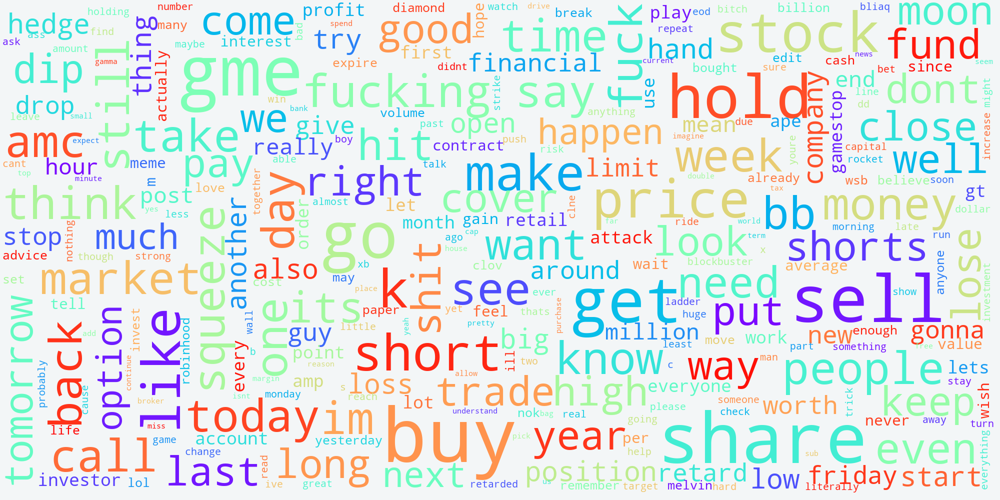

In [0]:
########## for wordcloud part, you can select a region and zoom in to check small words
wordcloud1 = WordCloud(background_color='#f3f6f7',scale=5, collocations = False,  \
                       max_words = max_words, max_font_size = 30, min_font_size = 3,\
                      colormap = 'rainbow',random_state=1).generate_from_frequencies(word_dict2021)
fig = go.Figure()
fig= px.imshow(wordcloud1.to_array())
fig.update_layout(
        title="<b>Wallstreetbets Most Common Words in 2021</b>",
        title_x = 0.5,
        title_y = 0.95,
        height=300,
        xaxis={"visible": False},
        yaxis={"visible": False},
        margin={"t": 50, "b": 0, "l": 0, "r": 0},
        hovermode=False,
        font=dict(
        family="Droid Sans",
        size=15,
        color='#696969'
    )
    )
fig.show()
fpath = os.path.join(PLOT_DIR, "topword_2021.html")
fig.write_html(fpath)


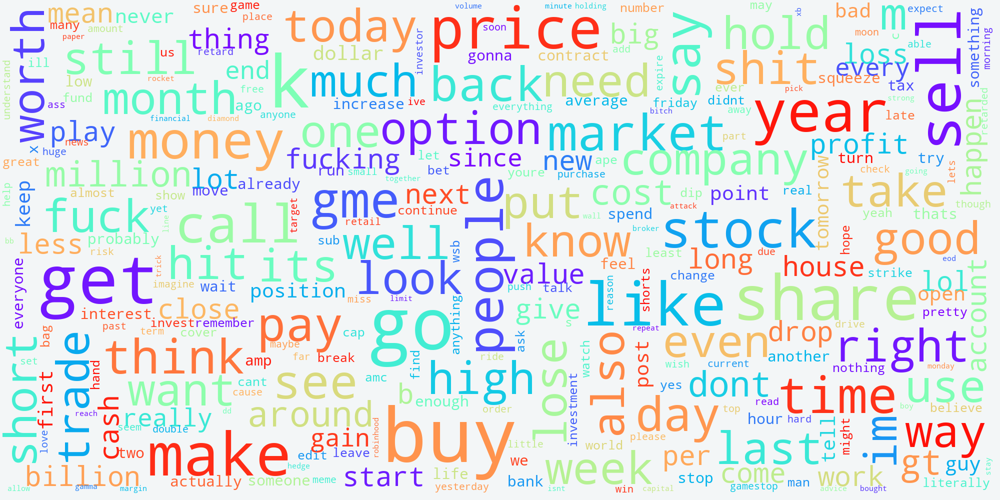

In [0]:
wordcloud2 = WordCloud(background_color='#f3f6f7',scale=5, collocations = False,  \
                       max_words = max_words, max_font_size = 30, min_font_size = 3,\
                      colormap = 'rainbow',random_state=1).generate_from_frequencies(word_dict2022)
fig = go.Figure()
fig= px.imshow(wordcloud2.to_array())
fig.update_layout(
        title="<b>Wallstreetbets Most Common Words in 2022</b>",
        title_x = 0.5,
        title_y = 0.95,
        height=300,
        xaxis={"visible": False},
        yaxis={"visible": False},
        margin={"t": 50, "b": 0, "l": 0, "r": 0},
        hovermode=False,
        font=dict(
        family="Droid Sans",
        size=15,
        color='#696969'
    )
    )
fig.show()
fpath = os.path.join(PLOT_DIR, "topword_2022.html")
fig.write_html(fpath)


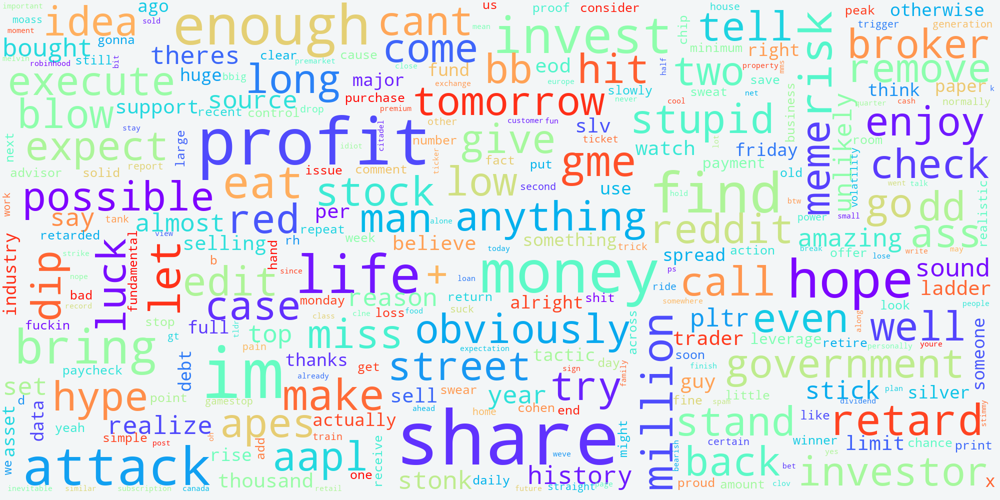

In [0]:
wordcloud3 = WordCloud(background_color='#f3f6f7',scale=5, collocations = False,  \
                       max_words = max_words, max_font_size = 30, min_font_size = 3,\
                      colormap = 'rainbow',random_state=1).generate_from_frequencies(word_dict2021_tfidf)
fig = go.Figure()
fig= px.imshow(wordcloud3.to_array())
fig.update_layout(
        title="<b>Wallstreetbets Important Words in 2021</b>",
        title_x = 0.5,
        title_y = 0.95,
        height=300,
        xaxis={"visible": False},
        yaxis={"visible": False},
        margin={"t": 50, "b": 0, "l": 0, "r": 0},
        hovermode=False,
        font=dict(
        family="Droid Sans",
        size=15,
        color='#696969'
    )
    )
fig.show()

fpath = os.path.join(PLOT_DIR, "topword_2021_tfidf.html")
fig.write_html(fpath)


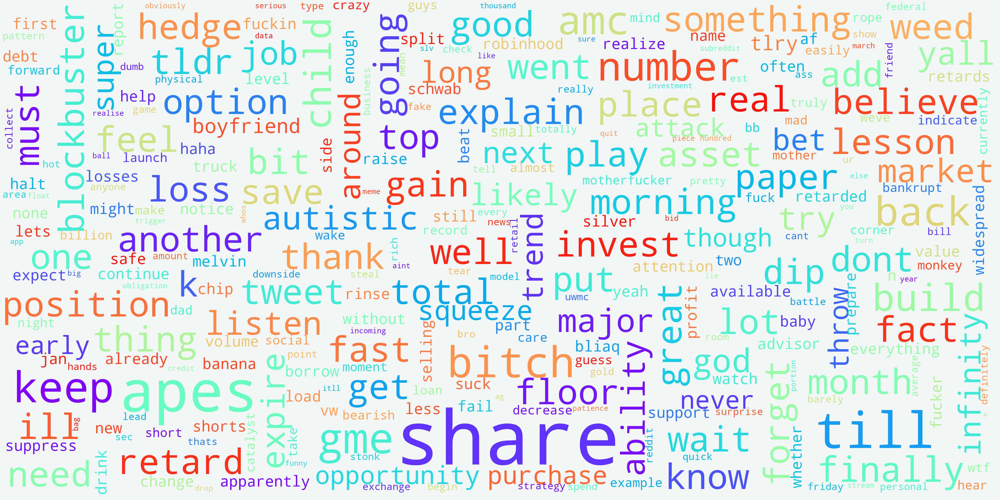

In [0]:
wordcloud4 = WordCloud(background_color='#f3f6f7',scale=10, collocations = False,  \
                       max_words = max_words, max_font_size = 30, min_font_size = 3,\
                      colormap = 'rainbow',random_state=1).generate_from_frequencies(word_dict2022_tfidf)
fig = go.Figure()
fig= px.imshow(wordcloud4.to_array())
fig.update_layout(
        title="<b>Wallstreetbets Important Words in 2022</b>",
        title_x = 0.5,
        title_y = 0.95,
        height=300,
        xaxis={"visible": False},
        yaxis={"visible": False},
        margin={"t": 50, "b": 0, "l": 0, "r": 0},
        hovermode=False,
        font=dict(
        family="Droid Sans",
        size=15,
        color='#696969'
    )
    )
fig.show()

fpath = os.path.join(PLOT_DIR, "topword_2022_tfidf.html")
fig.write_html(fpath)

### Sentiment Model

In [0]:
import sparknlp
from pyspark.ml import Pipeline
from sparknlp.annotator import *
from sparknlp.base import *
from sparknlp.pretrained import PretrainedPipeline

In [0]:
st_df = result_token1.withColumn("cleanText", result_token1["finished_cleanText"].getItem(0))

In [0]:
# Define Spark NLP pipleline
documentAssembler = DocumentAssembler()\
    .setInputCol("cleanText")\
    .setOutputCol("document")
    
use = UniversalSentenceEncoder.pretrained(name="tfhub_use", lang="en")\
 .setInputCols(["document"])\
 .setOutputCol("sentence_embeddings")


sentimentdl = SentimentDLModel.pretrained(name='sentimentdl_use_twitter', lang="en")\
    .setInputCols(["sentence_embeddings"])\
    .setOutputCol("sentiment")

nlpPipeline = Pipeline(
      stages = [
          documentAssembler,
          use,
          sentimentdl
      ])

tfhub_use download started this may take some time.
Approximate size to download 923.7 MB
[OK!]
sentimentdl_use_twitter download started this may take some time.
Approximate size to download 11.4 MB
[OK!]


In [0]:
# Run the pipeline
pipelineModel = nlpPipeline.fit(st_df)
st_result = pipelineModel.transform(st_df)

In [0]:
# drop redundant columns
st_result = st_result.drop('finished_cleanText','document','sentence_embeddings')

In [0]:
# Pull out the sentiment output into its own column in the main dataframe
st_result=st_result.withColumn('sentiment_class', F.concat_ws('',col('sentiment.result')))

In [0]:
st_result = st_result.withColumn("year", year(from_unixtime(col('created_utc'))))

In [0]:
sentiment_sum = st_result.groupBy('year', 'sentiment_class').agg(avg(col("length_of_body").cast("int")).alias("average_length_of_body"),
                                                                 avg(col("score").cast("int")).alias("average_score"),
                                  avg(col("ellipsis").cast("int")).alias("ellipsis_percentage"),
                                  avg(col("labor").cast("int")).alias("labor_percentage"),
                                  avg(col("yolo").cast("int")).alias("yolo_percentage")).orderBy('year', 'sentiment_class').toPandas()

In [0]:
# sentiment summary table for high score comments
sentiment_sum

,year,sentiment_class,average_length_of_body,average_score,ellipsis_percentage,labor_percentage,yolo_percentage
0,2021,,12.786617,35.487882,0.094310,0.007903,0.022655
1,2021,negative,18.177463,34.614540,0.070079,0.016932,0.027338
2,2021,neutral,14.563976,34.406215,0.065664,0.009139,0.028684
3,2021,positive,19.386538,34.726416,0.066089,0.012468,0.026282
4,2022,,13.858621,38.089655,0.068966,0.024138,0.027586
5,2022,negative,18.743179,37.039795,0.051282,0.038359,0.027897
6,2022,neutral,18.067633,36.559179,0.054348,0.028986,0.025362
7,2022,positive,19.831064,37.003404,0.051396,0.025187,0.031541


In [0]:
# save summary table
fpath = os.path.join(CSV_DIR, "sentiment_highs_core.csv")
sentiment_sum.to_csv(fpath)

In [0]:
st_eda_df = st_result.filter(col('sentiment_class') !='').groupBy('date','sentiment_class').agg(count('body').alias("comment_count"), \
                                                                                                avg("length_of_body").alias("avg_len"), \
                                                                                                avg("score").alias("avg_score"), \
                                                                                                avg("sp500").alias("sp500"), \
                                                                                                avg("nasdaq").alias("nasdaq"), 
                                                                                                avg("dj").alias("dj")) \
.orderBy(col("date"), ascending=True).toPandas()


In [0]:
import altair as alt

st_eda_df.rename(columns={"date":'Date',"sentiment_class":"Sentiment","comment_count":"Daily Comment Count",'avg_len':'Daily Average Text Length','avg_score':'Daily Average Score','sp500':'SP500 Index','nasdaq':"Nasdaq Index",'dj':"Dow Jones Index"},inplace=True)
st_eda_df

,Unnamed: 0,Date,Sentiment,Daily Comment Count,Daily Average Text Length,Daily Average Score,SP500 Index,Nasdaq Index,Dow Jones Index
0,0,2021-01-01,negative,27,13.444444,41.555556,3756.070068,12888.280273,30606.480469
1,1,2021-01-01,neutral,5,3.800000,31.600000,3756.070068,12888.280273,30606.480469
2,2,2021-01-01,positive,40,20.000000,31.200000,3756.070068,12888.280273,30606.480469
3,3,2021-01-02,positive,38,17.210526,36.868421,3756.070068,12888.280273,30606.480469
4,4,2021-01-02,negative,19,17.947368,30.473684,3756.070068,12888.280273,30606.480469
...,...,...,...,...,...,...,...,...,...
1780,1780,2022-08-30,neutral,9,10.666667,31.555556,3986.159912,11883.139648,31790.869141
1781,1781,2022-08-30,negative,26,12.153846,34.000000,3986.159912,11883.139648,31790.869141
1782,1782,2022-08-31,negative,56,25.785714,34.982143,3986.159912,11883.139648,31790.869141
1783,1783,2022-08-31,positive,77,23.324675,35.233766,3986.159912,11883.139648,31790.869141


In [0]:
### for the following plots, you can zoom in each plot by draging and selecting a certain region or scrolling the mouse wheel
### filter can be realized by selecting certain region or clicking corresponding bar to filter sentimnet
### each point on the plot represents a day within 2021-01-01 ~ 2022-08-31, you can use tooltip to get detailed information about each point

In [0]:
### y-axis is daily average score
### x-axis is stock market index
### bar plot shows the sum of the daily comment number after filtering operation interatived with plot

interval = alt.selection_interval()
scales = alt.selection_interval(bind='scales')
scales1 = alt.selection_interval(bind='scales')
click = alt.selection_multi(encodings=['color'])

####### sore
###part1
#sp500
scatter_score_s = alt.Chart(st_eda_df).mark_circle().encode(
     alt.X('SP500 Index:Q',
        scale=alt.Scale(zero=False)
    ),
        alt.Y('Daily Average Score:Q',
        scale=alt.Scale(zero=False)
    ),tooltip=['Date', 'Sentiment', 'Daily Comment Count', 'Daily Average Score','SP500 Index'],
    size ='Daily Comment Count:Q',
    color=alt.condition(interval, 'Sentiment:N', alt.value('lightgray'))
).add_selection(
    interval
).add_selection(
    scales
)

hist_score_s = alt.Chart(st_eda_df).mark_bar().encode(
    x='sum(Daily Comment Count):Q',
    y='Sentiment',
    color='Sentiment',tooltip=['Sentiment', 'sum(Daily Comment Count)'],
).transform_filter(
    interval
)

#nasdap
scatter_score_n = alt.Chart(st_eda_df).mark_circle().encode(
     alt.X('Nasdaq Index:Q',
        scale=alt.Scale(zero=False)
    ),
        alt.Y('Daily Average Score:Q',
        scale=alt.Scale(zero=False)
    ),tooltip=['Date', 'Sentiment', 'Daily Comment Count', 'Daily Average Score','Nasdaq Index'],
    size ='Daily Comment Count:Q',
    color=alt.condition(interval, 'Sentiment:N', alt.value('lightgray'))
).add_selection(
    interval
).add_selection(
    scales
)

hist_score_n = alt.Chart(st_eda_df).mark_bar().encode(
    x='sum(Daily Comment Count):Q',
    y='Sentiment',tooltip=['Sentiment', 'sum(Daily Comment Count)'],
    color='Sentiment'
).transform_filter(
    interval
)

# dj
#nasdap
scatter_score_d = alt.Chart(st_eda_df).mark_circle().encode(
     alt.X('Dow Jones Index:Q',
        scale=alt.Scale(zero=False)
    ),
        alt.Y('Daily Average Score:Q',
        scale=alt.Scale(zero=False)
    ),tooltip=['Date', 'Sentiment', 'Daily Comment Count', 'Daily Average Score','Dow Jones Index'],
    size ='Daily Comment Count:Q',
    color=alt.condition(interval, 'Sentiment:N', alt.value('lightgray'))
).add_selection(
    interval
).add_selection(
    scales
)

hist_score_d = alt.Chart(st_eda_df).mark_bar().encode(
    x='sum(Daily Comment Count):Q',
    y='Sentiment',
    color='Sentiment',tooltip=['Sentiment', 'sum(Daily Comment Count)'],
).transform_filter(
    interval
)


###part2
# sp500
scatter_score_s1 = alt.Chart(st_eda_df).mark_circle().encode(
     alt.X('SP500 Index:Q',
        scale=alt.Scale(zero=False)
    ),
        alt.Y('Daily Average Score:Q',
        scale=alt.Scale(zero=False)
    ),tooltip=['Date', 'Sentiment', 'Daily Comment Count', 'Daily Average Score','SP500 Index'],
    size ='Daily Comment Count:Q',
    color=alt.condition(interval, 'Sentiment:N', alt.value('lightgray'))
).transform_filter(
    click
).add_selection(
    scales1
)

hist_score_s1 = alt.Chart(st_eda_df).mark_bar().encode(
    x='sum(Daily Comment Count):Q',
    y='Sentiment',tooltip=['Sentiment', 'sum(Daily Comment Count)'],
    color=alt.condition(click, 'Sentiment', alt.value('lightgray'))
).add_selection(
    click
)

# nasdaq
scatter_score_n1 = alt.Chart(st_eda_df).mark_circle().encode(
     alt.X('Nasdaq Index:Q',
        scale=alt.Scale(zero=False)
    ),
        alt.Y('Daily Average Score:Q',
        scale=alt.Scale(zero=False)
    ),tooltip=['Date', 'Sentiment', 'Daily Comment Count', 'Daily Average Score','Nasdaq Index'],
    size ='Daily Comment Count:Q',
    color=alt.condition(interval, 'Sentiment:N', alt.value('lightgray'))
).transform_filter(
    click
).add_selection(
    scales1
)

hist_score_n1 = alt.Chart(st_eda_df).mark_bar().encode(
    x='sum(Daily Comment Count):Q',
    y='Sentiment',tooltip=['Sentiment', 'sum(Daily Comment Count)'],
    color=alt.condition(click, 'Sentiment', alt.value('lightgray'))
).add_selection(
    click
)

#dj
scatter_score_d1 = alt.Chart(st_eda_df).mark_circle().encode(
     alt.X('Dow Jones Index:Q',
        scale=alt.Scale(zero=False)
    ),
        alt.Y('Daily Average Score:Q',
        scale=alt.Scale(zero=False)
    ),tooltip=['Date', 'Sentiment', 'Daily Comment Count', 'Daily Average Score','Dow Jones Index'],
    size ='Daily Comment Count:Q',
    color=alt.condition(interval, 'Sentiment:N', alt.value('lightgray'))
).transform_filter(
    click
).add_selection(
    scales1
)

hist_score_d1 = alt.Chart(st_eda_df).mark_bar().encode(
    x='sum(Daily Comment Count):Q',
    y='Sentiment',tooltip=['Sentiment', 'sum(Daily Comment Count)'],
    color=alt.condition(click, 'Sentiment', alt.value('lightgray'))
).add_selection(
    click
)

charts= scatter_score_s & hist_score_s & scatter_score_s1 & hist_score_s1 | scatter_score_n & hist_score_n & scatter_score_n1 & hist_score_n1 | scatter_score_d & hist_score_d & scatter_score_d1 & hist_score_d1

charts = charts.properties(background = '#f3f6f7',
                    title = alt.TitleParams(text = 'Stock Market Index VS Comments Daily Average Score',
                                            subtitle = ['The first row: drag and select region to filter data    |    The second row: filter sentiment by click the corresponding bar'],
                                            font = 'Ubuntu Mono', 
                                            fontSize = 22, 
                                            color = '#696969', 
                                            subtitleFont = 'Ubuntu Mono',
                                            subtitleFontSize = 14, 
                                            subtitleColor = '#3E454F'))

fpath = os.path.join(PLOT_DIR, "sentiment_score.html")
charts.save(fpath)
charts

In [0]:
### y-axis is daily average text length
### x-axis is stock market index
### bar plot shows the sum of the daily comment number after filtering operation interatived with plot
interval = alt.selection_interval()
scales = alt.selection_interval(bind='scales')
scales1 = alt.selection_interval(bind='scales')
click = alt.selection_multi(encodings=['color'])

####### text length
###part1
#sp500
scatter_len_s = alt.Chart(st_eda_df).mark_circle().encode(
     alt.X('SP500 Index:Q',
        scale=alt.Scale(zero=False)
    ),
        alt.Y('Daily Average Text Length:Q',
        scale=alt.Scale(zero=False)
    ),tooltip=['Date', 'Sentiment', 'Daily Comment Count', 'Daily Average Text Length','SP500 Index'],
    size ='Daily Comment Count:Q',
    color=alt.condition(interval, 'Sentiment:N', alt.value('lightgray'))
).add_selection(
    interval
).add_selection(
    scales
)

hist_len_s = alt.Chart(st_eda_df).mark_bar().encode(
    x='sum(Daily Comment Count):Q',
    y='Sentiment',
    color='Sentiment',tooltip=['Sentiment', 'sum(Daily Comment Count)'],
).transform_filter(
    interval
)

#nasdap
scatter_len_n = alt.Chart(st_eda_df).mark_circle().encode(
     alt.X('Nasdaq Index:Q',
        scale=alt.Scale(zero=False)
    ),
        alt.Y('Daily Average Text Length:Q',
        scale=alt.Scale(zero=False)
    ),tooltip=['Date', 'Sentiment', 'Daily Comment Count', 'Daily Average Text Length','Nasdaq Index'],
    size ='Daily Comment Count:Q',
    color=alt.condition(interval, 'Sentiment:N', alt.value('lightgray'))
).add_selection(
    interval
).add_selection(
    scales
)

hist_len_n = alt.Chart(st_eda_df).mark_bar().encode(
    x='sum(Daily Comment Count):Q',
    y='Sentiment',
    color='Sentiment',tooltip=['Sentiment', 'sum(Daily Comment Count)'],
).transform_filter(
    interval
)

# dj
#nasdap
scatter_len_d = alt.Chart(st_eda_df).mark_circle().encode(
     alt.X('Dow Jones Index:Q',
        scale=alt.Scale(zero=False)
    ),
        alt.Y('Daily Average Text Length:Q',
        scale=alt.Scale(zero=False)
    ),tooltip=['Date', 'Sentiment', 'Daily Comment Count', 'Daily Average Text Length','Dow Jones Index'],
    size ='Daily Comment Count:Q',
    color=alt.condition(interval, 'Sentiment:N', alt.value('lightgray'))
).add_selection(
    interval
).add_selection(
    scales
)

hist_len_d = alt.Chart(st_eda_df).mark_bar().encode(
    x='sum(Daily Comment Count):Q',
    y='Sentiment',
    color='Sentiment',tooltip=['Sentiment', 'sum(Daily Comment Count)'],
).transform_filter(
    interval
)


###part2
# sp500
scatter_len_s1 = alt.Chart(st_eda_df).mark_circle().encode(
     alt.X('SP500 Index:Q',
        scale=alt.Scale(zero=False)
    ),
        alt.Y('Daily Average Text Length:Q',
        scale=alt.Scale(zero=False)
    ),tooltip=['Date', 'Sentiment', 'Daily Comment Count', 'Daily Average Text Length','SP500 Index'],
    size ='Daily Comment Count:Q',
    color=alt.condition(interval, 'Sentiment:N', alt.value('lightgray'))
).transform_filter(
    click
).add_selection(
    scales1
)

hist_len_s1 = alt.Chart(st_eda_df).mark_bar().encode(
    x='sum(Daily Comment Count):Q',
    y='Sentiment',tooltip=['Sentiment', 'sum(Daily Comment Count)'],
    color=alt.condition(click, 'Sentiment', alt.value('lightgray'))
).add_selection(
    click
)

# nasdaq
scatter_len_n1 = alt.Chart(st_eda_df).mark_circle().encode(
     alt.X('Nasdaq Index:Q',
        scale=alt.Scale(zero=False)
    ),
        alt.Y('Daily Average Text Length:Q',
        scale=alt.Scale(zero=False)
    ),tooltip=['Date', 'Sentiment', 'Daily Comment Count', 'Daily Average Text Length','Nasdaq Index'],
    size ='Daily Comment Count:Q',
    color=alt.condition(interval, 'Sentiment:N', alt.value('lightgray'))
).transform_filter(
    click
).add_selection(
    scales1
)

hist_len_n1 = alt.Chart(st_eda_df).mark_bar().encode(
    x='sum(Daily Comment Count):Q',
    y='Sentiment',tooltip=['Sentiment', 'sum(Daily Comment Count)'],
    color=alt.condition(click, 'Sentiment', alt.value('lightgray'))
).add_selection(
    click
)

#dj
scatter_len_d1 = alt.Chart(st_eda_df).mark_circle().encode(
     alt.X('Dow Jones Index:Q',
        scale=alt.Scale(zero=False)
    ),
        alt.Y('Daily Average Text Length:Q',
        scale=alt.Scale(zero=False)
    ),tooltip=['Date', 'Sentiment', 'Daily Comment Count', 'Daily Average Text Length','Dow Jones Index'],
    size ='Daily Comment Count:Q',
    color=alt.condition(interval, 'Sentiment:N', alt.value('lightgray'))
).transform_filter(
    click
).add_selection(
    scales1
)

hist_len_d1 = alt.Chart(st_eda_df).mark_bar().encode(
    x='sum(Daily Comment Count):Q',
    y='Sentiment',tooltip=['Sentiment', 'sum(Daily Comment Count)'],
    color=alt.condition(click, 'Sentiment', alt.value('lightgray'))
).add_selection(
    click
)



charts= scatter_len_s & hist_len_s & scatter_len_s1 & hist_len_s1 | scatter_len_n & hist_len_n & scatter_len_n1 & hist_len_n1 | scatter_len_d & hist_len_d & scatter_len_d1 & hist_len_d1

charts = charts.properties(background = '#f3f6f7',
                    title = alt.TitleParams(text = 'Stock Market Index VS Comments Daily Average Text Length',
                                            subtitle = ['The first row: drag and select region to filter data    |    The second row: filter sentiment by click the corresponding bar'],
                                            font = 'Ubuntu Mono', 
                                            fontSize = 22, 
                                            color = '#696969', 
                                            subtitleFont = 'Ubuntu Mono',
                                            subtitleFontSize = 14, 
                                            subtitleColor = '#3E454F'))

fpath = os.path.join(PLOT_DIR, "sentiment_len.html")
charts.save(fpath)
charts

In [0]:
# save to DBFS
st_result.write.mode('Overwrite').parquet('dbfs:/FileStore/nlp_result.parquet')